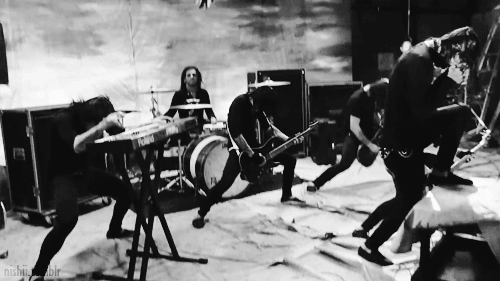

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!pip install librosa
!pip install PySoundFile audioread


In [ ]:
#!pip install --upgrade librosa

In [ ]:
import numpy as np
import librosa, librosa.display
import matplotlib.pyplot as plt

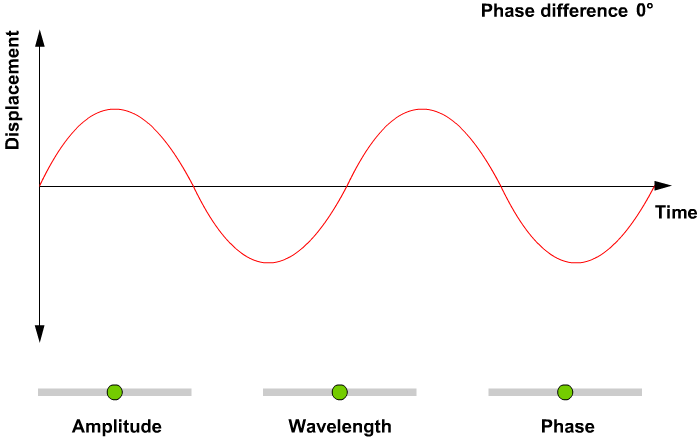

In [ ]:
from IPython.display import Image

# Display the GIF
Image(filename='/content/drive/MyDrive/MIS-548/amplitude.gif')

In [ ]:
# Load the audio file using librosa's load function. This function reads the audio file specified by the 'path' parameter.
# 'sr=22050' sets the sample rate to 22050 Hz, which means the audio will be resampled to this rate if it's not already.
# 'librosa.load' returns the audio time series data as a numpy array ('signal') and the sampling rate of the audio file ('sample_rate').
example_audio = "/content/drive/MyDrive/MIS-548/Data/Audio_data/blues/blues.00000.wav"
signal, sample_rate = librosa.load(example_audio)
print("Sample rate of dataset is", sample_rate, "Hz")

Sample rate of dataset is 22050 Hz


In [ ]:
import IPython.display as ipd
ipd.Audio(example_audio)

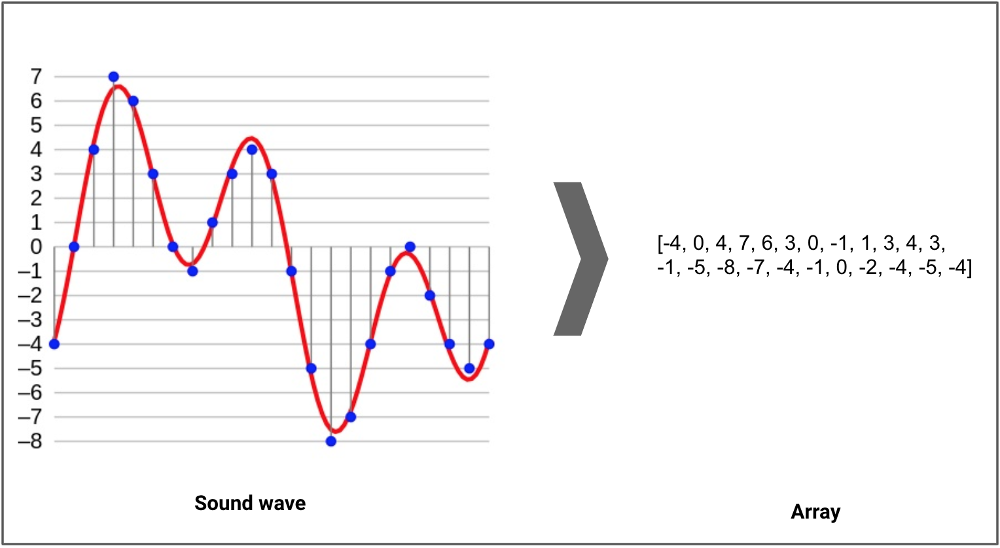

In [ ]:
# Display the Sound wave to array
Image(filename='/content/drive/MyDrive/MIS-548/sampling rate.png')

**Visualizing Audio: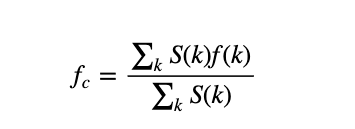**

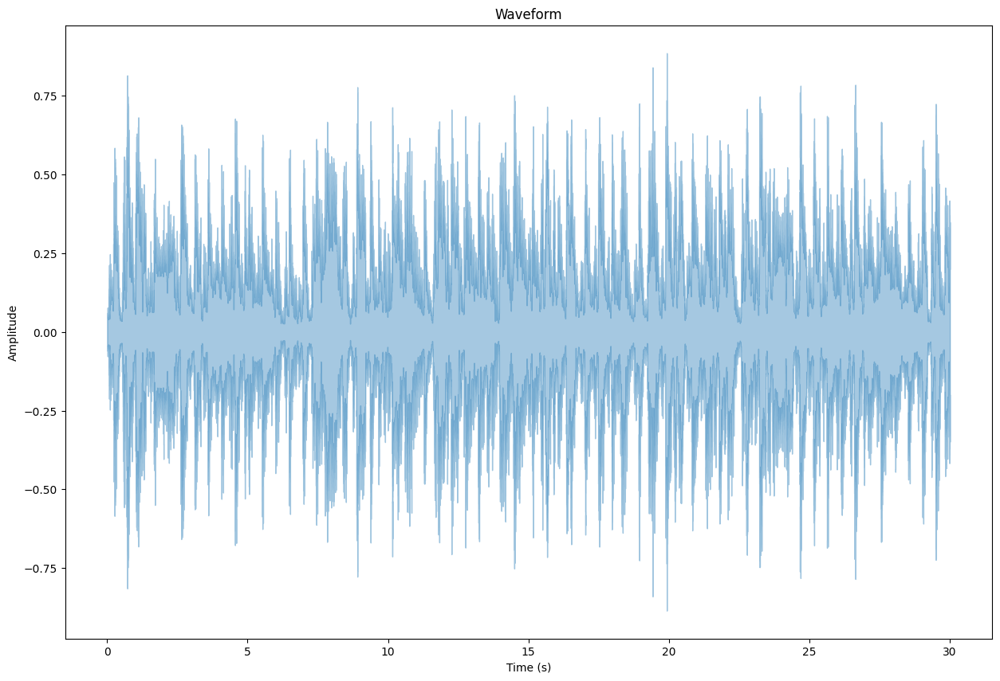

In [ ]:
# Initialize a figure with matplotlib, setting the size of the figure to 15x10 inches for better visibility.
plt.figure(figsize=(15, 10))

# Plot the waveform of the audio signal using librosa's waveshow function.
# 'signal' is the audio time series data to be plotted.
# 'sr=sample_rate' specifies the sampling rate, which helps librosa calculate the time axis for the waveform correctly.
# 'alpha=0.4' sets the transparency of the waveform plot, making it 40% transparent.
librosa.display.waveshow(signal, sr=sample_rate, alpha=0.4)

# Label the x-axis as "Time (s)" indicating that the horizontal axis represents time in seconds.
plt.xlabel("Time (s)")

# Label the y-axis as "Amplitude" indicating that the vertical axis represents the amplitude of the audio signal.
# Amplitude in this context refers to the signal strength or loudness at a particular time point.
plt.ylabel("Amplitude")

# Set the title of the plot to "Waveform" to indicate that this plot represents the waveform of the loaded audio signal.
plt.title("Waveform")

# Display the plot. This line causes the figure to be shown in a new window or in your notebook if you are using a Jupyter environment.
plt.show()


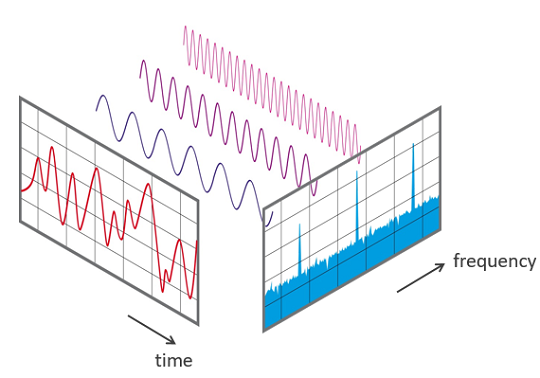

In [ ]:
# Display the time and frequency
Image(filename='/content/drive/MyDrive/MIS-548/frequency_time.png')

### Move from Time domain to Frequency domain

To do that we need to do FFT, to get spectrum and we need np

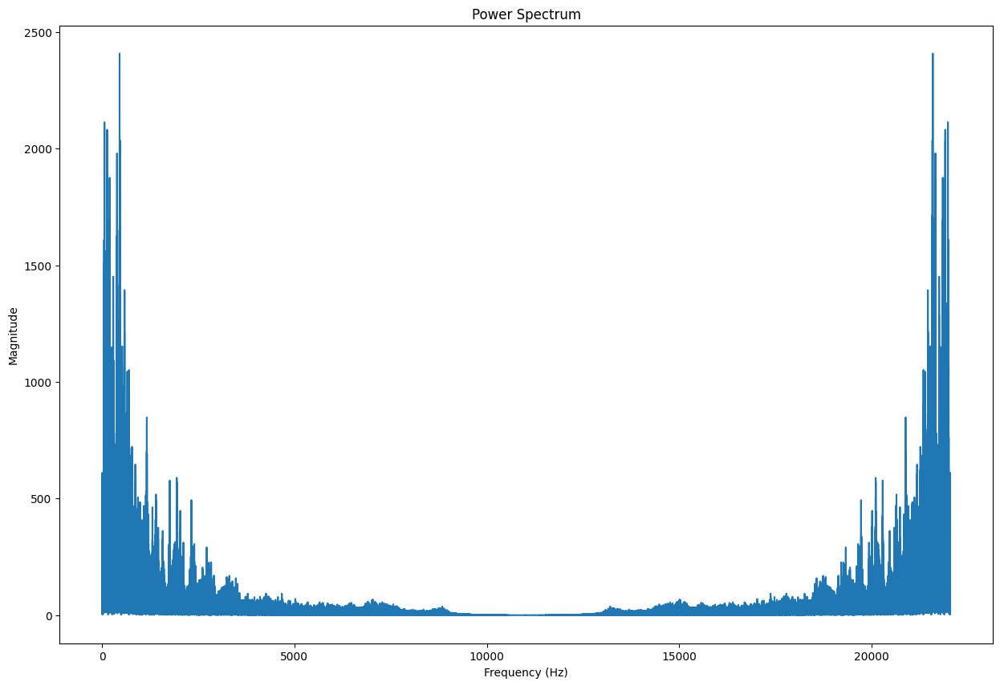

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Perform the Fourier Transform on the audio signal.
# The Fourier Transform converts the time-domain signal into the frequency domain,
# decomposing the signal into its constituent frequencies and their amplitudes.
fft = np.fft.fft(signal)

# Calculate the magnitudes of the complex numbers returned by the Fourier Transform.
# The magnitude of each complex number represents the amplitude of a particular frequency component,
# giving us the contribution of each frequency to the overall sound.
magnitude = np.abs(fft)

# Generate an array of frequency values. These are the actual frequencies represented at each
# point in the FFT. The array runs from 0 to the sample rate, with the number of points
# equal to the length of the magnitude array.
# np.linspace(start, end, num_points) creates a linearly spaced array from start to end with num_points.
frequency = np.linspace(0, sample_rate, len(magnitude))

# Plot the power spectrum.
# The x-axis represents frequency, and the y-axis represents the magnitude of each frequency.
# This plot shows how much each frequency contributes to the overall sound, indicating the
# strength or loudness of different frequencies in the sound.
plt.figure(figsize=(15, 10))
plt.plot(frequency, magnitude)
plt.xlabel("Frequency (Hz)")  # Label x-axis with units in Hertz
plt.ylabel("Magnitude")       # Label y-axis as Magnitude which represents amplitude
plt.title("Power Spectrum")   # Title of the plot
plt.show()


### TAKEAWAY:

* The takeaway from the graph, most of the frequencies are concentrated/more contribution in the lower frequencies and the higher we go lower the frequencies,or in other words we can say, there is a less contribution.

* The graph is symmetrical. ie, half of the sample rate. So from the property of the Fourier Transform.

But we dont need to get into more details of that now, becaus ewe dont need them. But what we need to understand from them is that, we dont need the whole plot. We can see that the first half of the information is something repeated again. So, lets focus on the first half,ie., Left frequency.

### Taking the first half of the Frequency

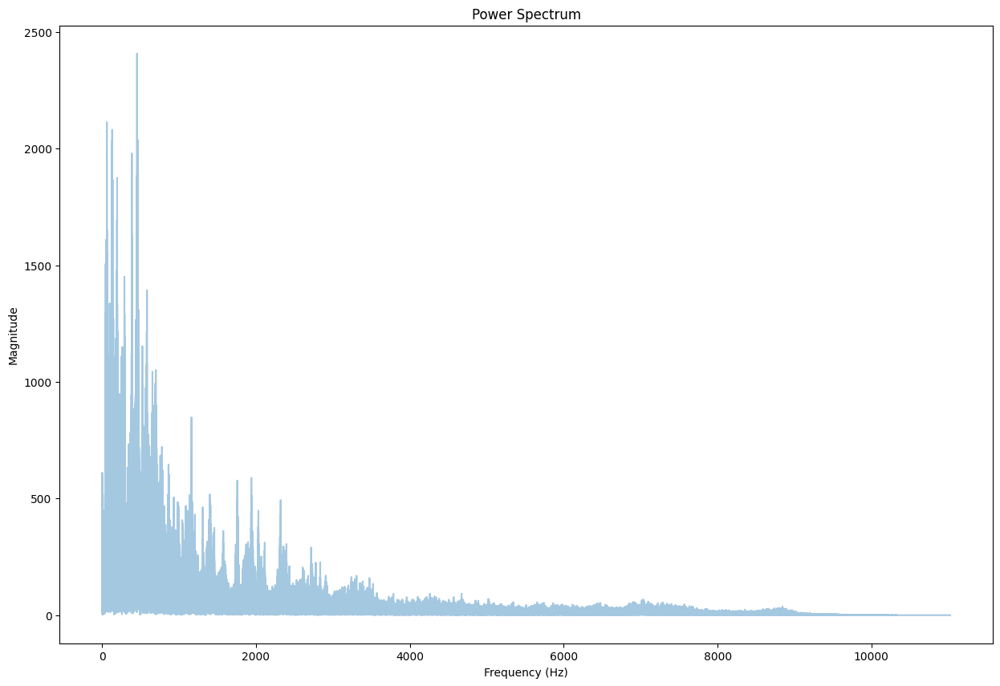

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Calculate absolute values on the complex numbers from the FFT to get the magnitude.
# This converts the complex FFT output to a magnitude spectrum which shows the amplitude
# of each frequency component of the audio signal.
spectrum = np.abs(fft)

# Create an array of frequency values. These are linearly spaced from 0 up to the sample rate.
# The array has the same length as the 'spectrum' array. Each element in 'f' corresponds to
# the frequency in Hertz for the respective element in the 'spectrum'.
f = np.linspace(0, sample_rate, len(spectrum))

# The FFT output contains both positive and negative frequencies, but for real signals,
# the spectrum is symmetrical. Therefore, we only need the first half of the spectrum.
# Here we take up to the Nyquist frequency, which is half the sampling rate.
left_spectrum = spectrum[:int(len(spectrum)/2)]
left_f = f[:int(len(spectrum)/2)]

# Define the figure size as a tuple (width, height) in inches.
FIG_SIZE = (15, 10)

# Plot the first half of the spectrum.
# We plot 'left_f' on the x-axis which represents frequency and 'left_spectrum' on the y-axis which represents magnitude.
# 'alpha=0.4' sets the transparency of the line to 40%, making it semi-transparent.
plt.figure(figsize=FIG_SIZE)
plt.plot(left_f, left_spectrum, alpha=0.4)
plt.xlabel("Frequency (Hz)")  # Label the x-axis with 'Frequency' in Hertz.
plt.ylabel("Magnitude")       # Label the y-axis with 'Magnitude'.
plt.title("Power Spectrum")   # Title the plot as "Power Spectrum".
plt.show()


So we can see that most of the frequencies are there in the lower frequencies.

### Drawback of having only Power Spectrum

It is a static snapshot of the whole sound. It considers averaging the energy of the different frequency in the whole sound. What we are interested to know is the how much these different frequencies contributing to the overall sound. Inorder to do that we have to do, Short Time Fourier Transform(STFT) and then get a Spectogram. So a Spectogram is going to give the information of the frequency and time.

In [ ]:
# Define hop_length and n_fft for the STFT
# 'hop_length' is the number of samples over which the window shifts after each FFT computation.
# It determines the amount of overlap between successive FFT windows. A smaller hop_length leads to
# higher overlap and finer time resolution in the resulting spectrogram.
hop_length = 512  # number of samples

# 'n_fft' defines the size of the FFT window in number of samples, indicating how many samples of the audio
# signal are included in each FFT computation. The choice of n_fft affects the frequency resolution of the
# resulting spectrogram; a larger n_fft provides finer frequency resolution but coarser time resolution.
n_fft = 2048  # window size in number of samples

# Calculate the duration in seconds of the hop length and the FFT window. This conversion helps in understanding
# the temporal resolution of the STFT in the context of the sampling rate of the audio.
# Dividing the number of samples by the sample rate converts these values from samples to seconds.
hop_length_duration = float(hop_length) / sample_rate
n_fft_duration = float(n_fft) / sample_rate

# Print the durations. These values indicate how quickly the FFT window moves across the audio signal and
# the duration of the audio analyzed in each FFT segment.
print("STFT hop length duration is: {:.4f}s".format(hop_length_duration))
print("STFT window duration is: {:.4f}s".format(n_fft_duration))


STFT hop length duration is: 0.0232s
STFT window duration is: 0.0929s


# **Spectrogram**

A spectrogram is a visual way of representing the signal strength, or “loudness”, of a signal over time at various frequencies present in a particular waveform. Not only can one see whether there is more or less energy at, for example, 2 Hz vs 10 Hz, but one can also see how energy levels vary over time.

A spectrogram is usually depicted as a heat map, i.e., as an image with the intensity shown by varying the color or brightness.

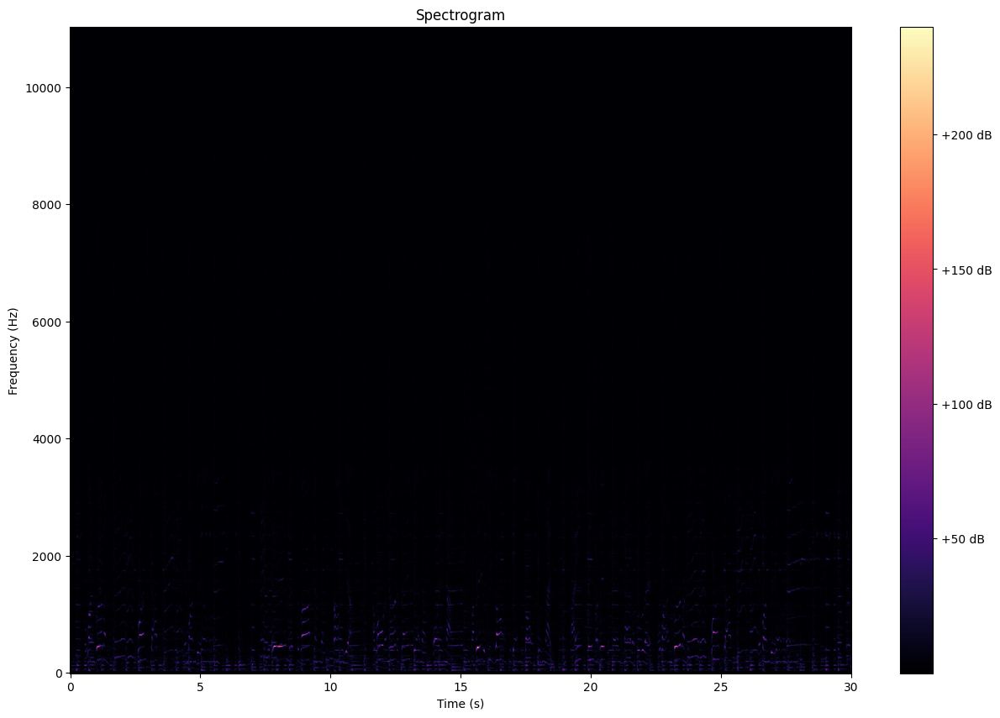

In [ ]:
# Set the parameters for the STFT
hop_length = 512  # The number of samples to advance each frame (window shift)
n_fft = 2048      # The number of samples in each frame (window size)

# Perform the STFT. The result is a complex matrix where the rows correspond to frequency bins
# and the columns correspond to time frames.
stft = librosa.stft(signal, n_fft=n_fft, hop_length=hop_length)

# Calculate the magnitude of the complex-valued STFT, discarding the phase information.
# The result is a matrix where each element represents the amplitude of a particular frequency
# at a specific time.
spectrogram = np.abs(stft)

# Define the figure size
FIG_SIZE = (15, 10)

# Plot the spectrogram using Librosa's specshow function, which handles the axis scaling.
plt.figure(figsize=FIG_SIZE)
# specshow parameters:
# 'spectrogram' is the magnitude matrix calculated from the STFT.
# 'sr' is the sample rate, used to scale the frequency axis.
# 'hop_length' is used to scale the time axis correctly.
# 'x_axis' and 'y_axis' to label the axes with 'time' and 'mel' (or another frequency scale like 'linear' or 'log').
librosa.display.specshow(spectrogram, sr=sample_rate, hop_length=hop_length, x_axis='time', y_axis='linear')
plt.colorbar(format='%+2.0f dB')  # Add a color bar with label formatted in decibels.
plt.xlabel("Time (s)")            # Label the x-axis with 'Time (s)'
plt.ylabel("Frequency (Hz)")      # Label the y-axis with 'Frequency (Hz)'
plt.title("Spectrogram")          # Title the plot as "Spectrogram"
plt.show()


**Takeaway**

As we can see, most of the frequencies contribute very very low to the overall sound. But at the down in the bottom, we are able to see some energy, which we can expect from the power spectrum.

But there is a way of moving these amplitudes, and visualizing them in a nice way, which makes more sense. So for that we can calculate the log of the spectogram and the use librosa's - amplitude to decibels.

Text(0.5, 1.0, 'Spectrogram (dB)')

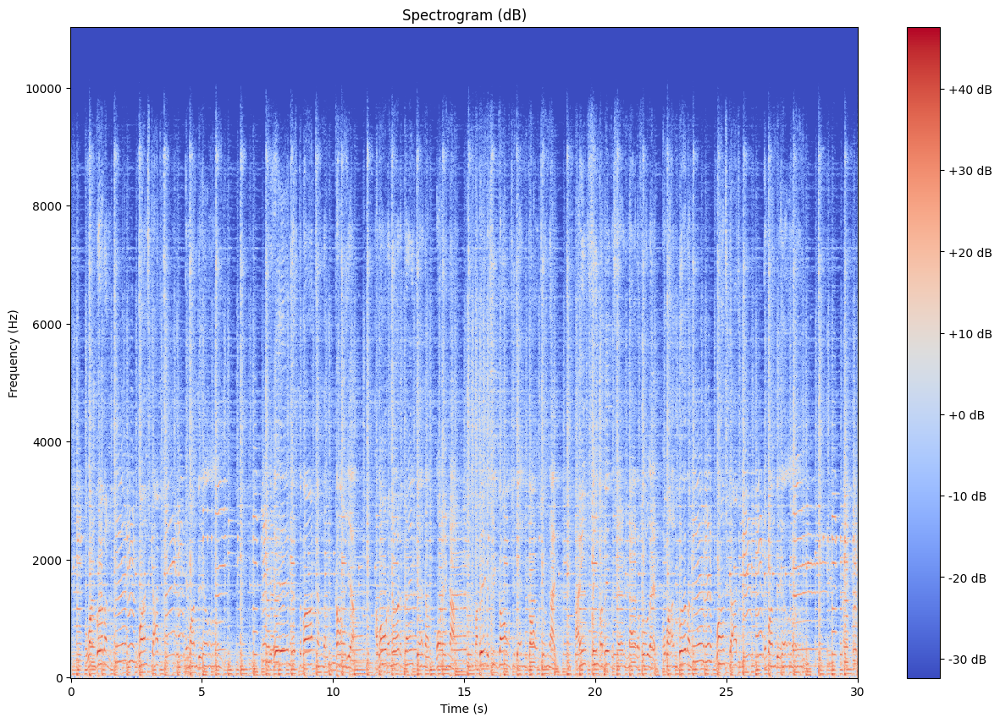

In [ ]:
# Assuming the 'spectrogram', 'sample_rate', and 'hop_length' are already defined from our previous STFT calculation:
# spectrogram = np.abs(librosa.stft(signal, n_fft=2048, hop_length=512))

# Convert the amplitude spectrogram to decibel units, which is a logarithmic unit used to express the ratio of
# a value of a physical property (in this case, amplitude) to a reference level. This transformation helps to
# manage the wide range of amplitudes in audio signals by compressing the scale but maintaining distinctions in level.
log_spectrogram = librosa.amplitude_to_db(spectrogram)

# Define the figure size for consistency and better visualization
FIG_SIZE = (15, 10)

# Create the plot with specified figure size
plt.figure(figsize=FIG_SIZE)

# Plot the log-scaled spectrogram using Librosa's specshow function
# Parameters:
# 'log_spectrogram': The dB-scaled spectrogram matrix.
# 'sr': Sampling rate, used to determine the time axis scaling.
# 'hop_length': Defines the stride between time steps in the STFT, used for proper time axis scaling.
# 'x_axis': Set to 'time' to label the x-axis in units of time (seconds).
# 'y_axis': Set to 'linear' to use a linear frequency scale on the y-axis; change to 'log' if logarithmic scale is desired.
librosa.display.specshow(log_spectrogram, sr=sample_rate, hop_length=hop_length, x_axis='time', y_axis='linear')

# Add a color bar with a label to indicate the scale and units of the spectrogram (in dB).
plt.colorbar(format='%+2.0f dB')

# Label the axes for clear understanding
plt.xlabel("Time (s)")
plt.ylabel("Frequency (Hz)")

# Title the plot to reflect the data representation
plt.title("Spectrogram (dB)")


**Observation**

Now we are able to see more things than earlier. That is blue color - very very quiet sounds like -30db and towards orange, it's increasing. And also we can see that most of the energy, has been constructed in the lower frequencies. As we remember our original audio wave, was quite stable, this also depicting the same.

# **Feature extraction from Audio signal**

Every audio signal consists of many features. However, we must extract the characteristics that are relevant to the problem we are trying to solve. The process of extracting features to use them for analysis is called feature extraction. Let us study a few of the features in detail.

The spectral features (frequency-based features), which are obtained by converting the time-based signal into the frequency domain using the Fourier Transform, like fundamental frequency, frequency components, spectral centroid, spectral flux, spectral density, spectral roll-off, etc.

### **1. Spectral Centroid**

The spectral centroid indicates at which frequency the energy of a spectrum is centered upon or in other words It indicates where the ” center of mass” for a sound is located. This is like a weighted mean:


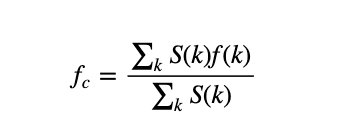

where S(k) is the spectral magnitude at frequency bin k, f(k) is the frequency at bin k.

.spectral_centroid will return an array with columns equal to a number of frames present in our sample.

In [ ]:
signal, sample_rate = librosa.load(example_audio)

# Compute spectral centroid
spectral_centroids = librosa.feature.spectral_centroid(y=signal, sr=sample_rate)[0]
spectral_centroids.shape


(1293,)

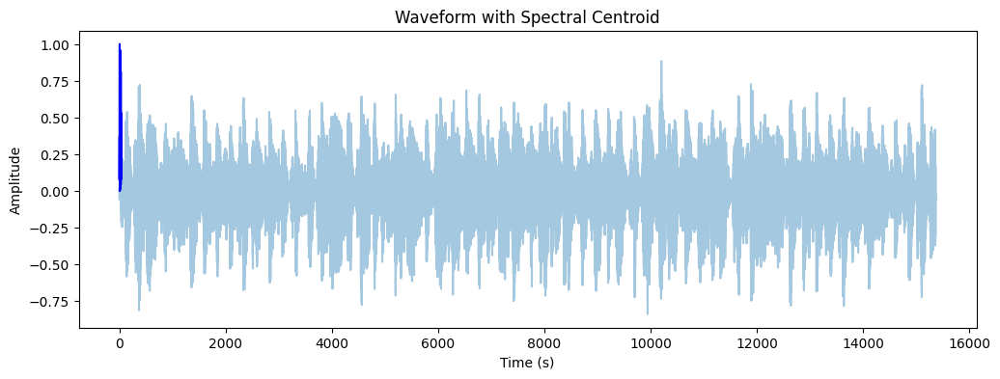

In [ ]:
import matplotlib.pyplot as plt
import librosa.display
import sklearn.preprocessing

# Computing the time variable for visualization
plt.figure(figsize=(12, 4))
t = librosa.times_like(signal)

# Normalizing the spectral centroid for visualization
def normalize(x, axis=0):
    return sklearn.preprocessing.minmax_scale(x, axis=axis)

# Plotting the waveform of the audio signal
plt.plot(t, signal, alpha=0.4)

# Plotting the Spectral Centroid along the waveform
plt.plot(t[:len(spectral_centroids)], normalize(spectral_centroids), color='b')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.title('Waveform with Spectral Centroid')
plt.show()


**ZOOMING IN**

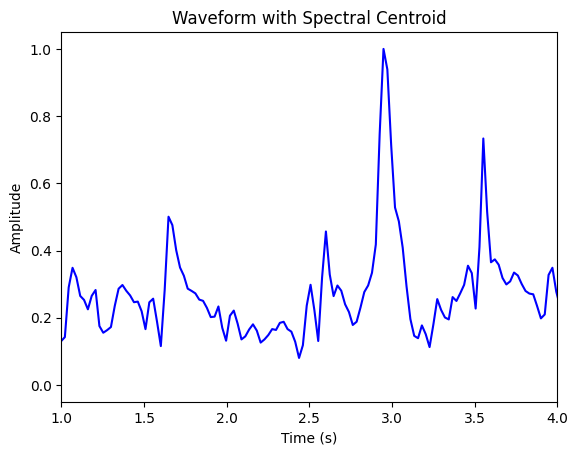

In [ ]:

# Plotting the Spectral Centroid along the waveform
plt.plot(t[:len(spectral_centroids)], normalize(spectral_centroids), color='b')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.title('Waveform with Spectral Centroid')
plt.xlim(1, 4)  # Setting the x-axis limit from 1 to 4 seconds
plt.show()


**2. Spectral Rolloff**

It is a measure of the shape of the signal. It represents the frequency at which high frequencies decline to 0. To obtain it, we have to calculate the fraction of bins in the power spectrum where 85% of its power is at lower frequencies.

librosa.feature.spectral_rolloff computes the rolloff frequency for each frame in a signal:

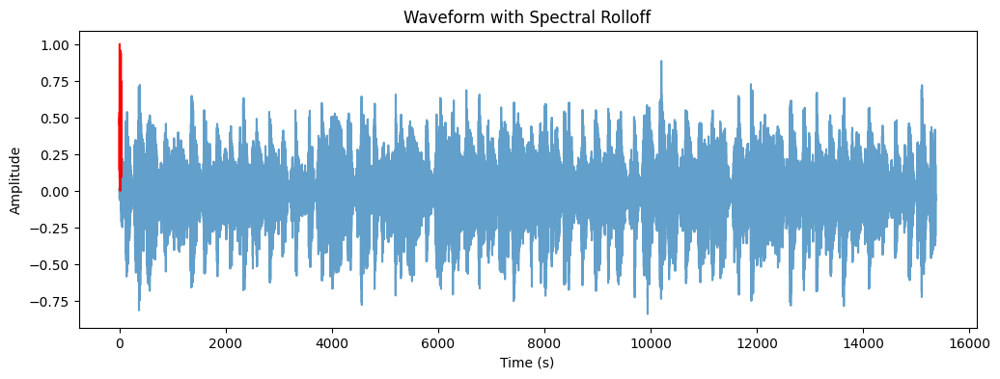

In [ ]:
import matplotlib.pyplot as plt
import librosa.display
import sklearn.preprocessing

# Compute spectral rolloff
spectral_rolloff = librosa.feature.spectral_rolloff(y=signal, sr=sample_rate)[0]

# Computing the time variable for visualization
plt.figure(figsize=(12, 4))
t = librosa.frames_to_time(range(len(signal)), sr=sample_rate)

# Normalizing the spectral rolloff for visualization
def normalize(x, axis=0):
    return sklearn.preprocessing.minmax_scale(x, axis=axis)

# Plotting the waveform of the audio signal
plt.plot(t, signal, alpha=0.7)

# Plotting the Spectral Rolloff along the waveform
plt.plot(t[:len(spectral_rolloff)], normalize(spectral_rolloff), color='r')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.title('Waveform with Spectral Rolloff')
plt.show()


**ZOOMING IN**

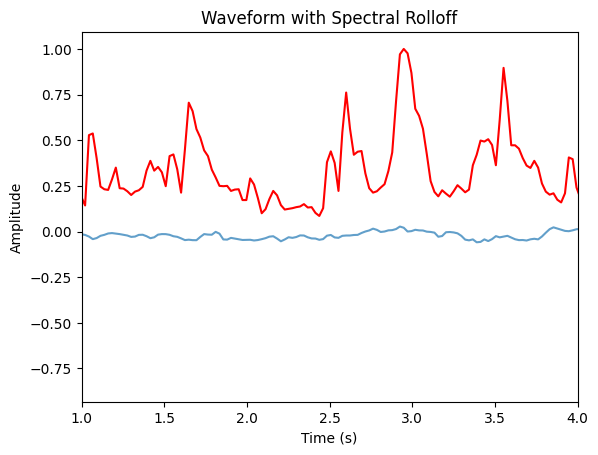

In [ ]:
# Plotting the waveform of the audio signal
plt.plot(t, signal, alpha=0.7)

# Plotting the Spectral Rolloff along the waveform
plt.plot(t[:len(spectral_rolloff)], normalize(spectral_rolloff), color='r')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.title('Waveform with Spectral Rolloff')
plt.xlim(1, 4)  # Setting the x-axis limit from 1 to 4 seconds
plt.show()

**3. Spectral Bandwidth**

The spectral bandwidth is defined as the width of the band of light at one-half the peak maximum (or full width at half maximum [FWHM]) and is represented by the two vertical red lines and λSB on the wavelength axis.



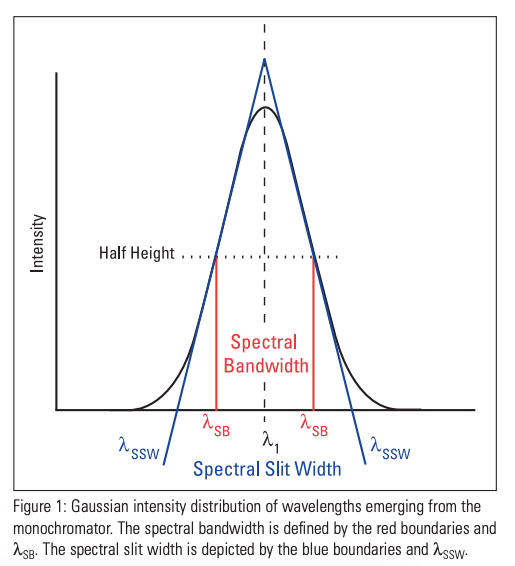

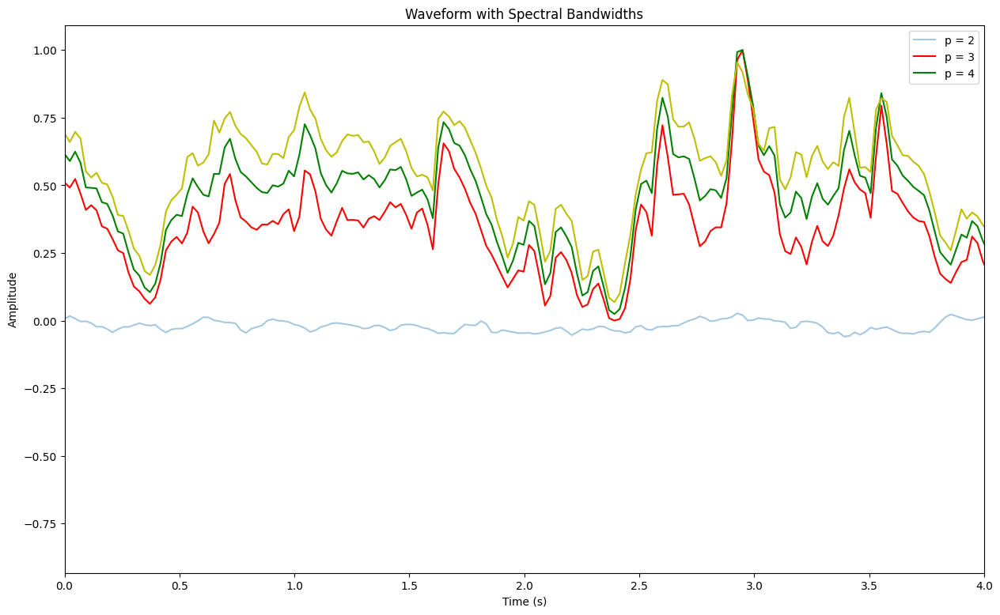

In [ ]:
import matplotlib.pyplot as plt
import sklearn.preprocessing

# Computing the time variable for visualization
t = librosa.times_like(signal, sr=sample_rate)

# Normalizing the spectral bandwidths for visualization
def normalize(x, axis=0):
    return sklearn.preprocessing.minmax_scale(x, axis=axis)

# Compute spectral bandwidths for different values of p
spectral_bandwidth_2 = librosa.feature.spectral_bandwidth(y=signal, sr=sample_rate, p=2)[0]
spectral_bandwidth_3 = librosa.feature.spectral_bandwidth(y=signal, sr=sample_rate, p=3)[0]
spectral_bandwidth_4 = librosa.feature.spectral_bandwidth(y=signal, sr=sample_rate, p=4)[0]

# Plotting the waveform of the audio signal
plt.figure(figsize=(15, 9))
plt.plot(t, signal, alpha=0.4)

# Plotting the spectral bandwidths along the waveform
plt.plot(t[:len(spectral_bandwidth_2)], normalize(spectral_bandwidth_2), color='r')
plt.plot(t[:len(spectral_bandwidth_3)], normalize(spectral_bandwidth_3), color='g')
plt.plot(t[:len(spectral_bandwidth_4)], normalize(spectral_bandwidth_4), color='y')

plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.title('Waveform with Spectral Bandwidths')
plt.legend(('p = 2', 'p = 3', 'p = 4'))
# Setting x-axis limit to 0-4 seconds
plt.xlim(0, 4)

plt.show()


**4. Zero-Crossing Rate**

A very simple way for measuring the smoothness of a signal is to calculate the number of zero-crossing within a segment of that signal. A voice signal oscillates slowly — for example, a 100 Hz signal will cross zero 100 per second — whereas an unvoiced fricative can have 3000 zero crossings per second.

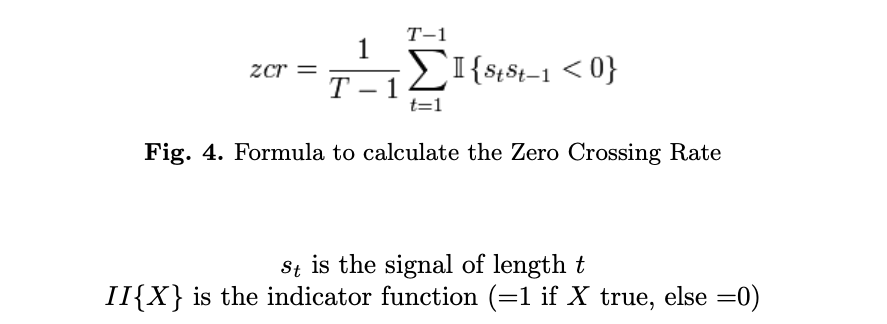


It usually has higher values for highly percussive sounds like those in metal and rock. Now let us visualize it and see how we calculate zero crossing rate.

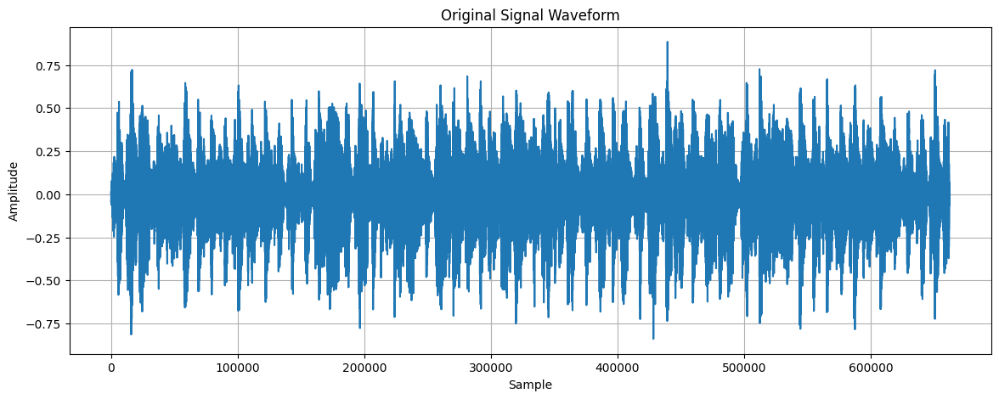

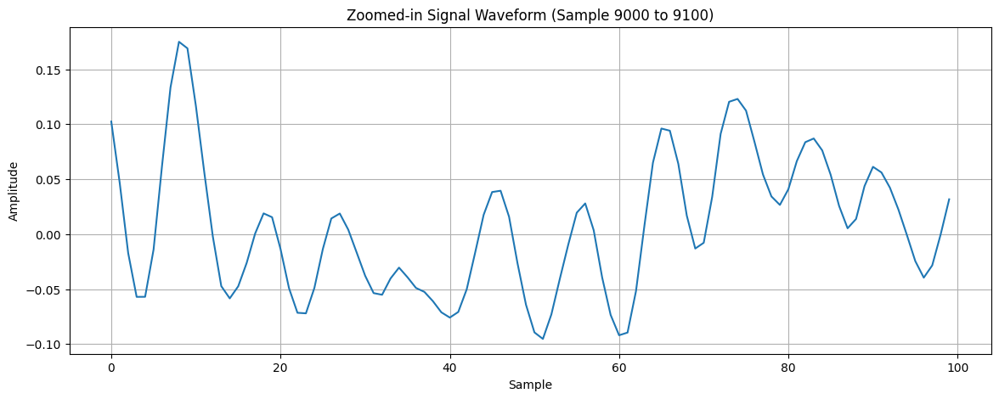

In [ ]:
import matplotlib.pyplot as plt

# Load the audio file
x, sr = librosa.load(example_audio)

# Plot the original signal
plt.figure(figsize=(14, 5))
plt.plot(x)
plt.xlabel('Sample')
plt.ylabel('Amplitude')
plt.title('Original Signal Waveform')
plt.grid()

# Zooming in
n0 = 9000
n1 = 9100
plt.figure(figsize=(14, 5))
plt.plot(x[n0:n1])
plt.xlabel('Sample')
plt.ylabel('Amplitude')
plt.title('Zoomed-in Signal Waveform (Sample 9000 to 9100)')
plt.grid()

plt.show()


In [ ]:
zero_crossings = librosa.zero_crossings(x[n0:n1], pad=False)
print(sum(zero_crossings))#16

16


**5. Mel-Frequency Cepstral Coefficients(MFCCs)**

The Mel frequency cepstral coefficients (MFCCs) of a signal are a small set of features (usually about 10–20) which concisely describe the overall shape of a spectral envelope. It models the characteristics of the human voice.

(20, 1293)


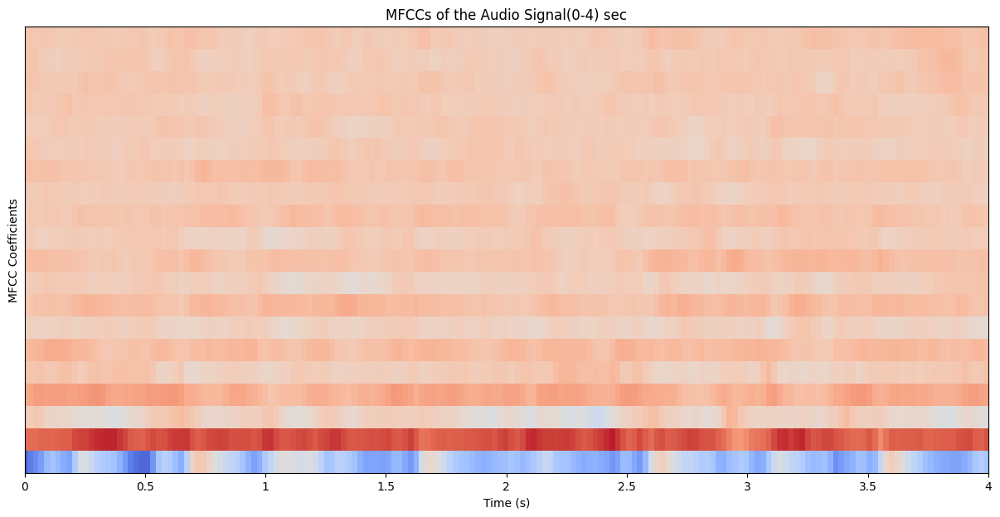

In [ ]:
import matplotlib.pyplot as plt
import librosa.display

# Assuming 'x' and 'sr' are defined as the audio signal and its sample rate, respectively

# Compute MFCCs
mfccs = librosa.feature.mfcc(y=x, sr=sr)

# Print the shape of the MFCCs
print(mfccs.shape)  # Output: (20, 97)

# Display the MFCCs
plt.figure(figsize=(15, 7))
librosa.display.specshow(mfccs, sr=sr, x_axis='time')

# Set the title of the plot
plt.title('MFCCs of the Audio Signal(0-4) sec')
plt.xlabel("Time (s)")               # Label the x-axis with 'Time (s)'
plt.ylabel("MFCC Coefficients")
# Setting x-axis limit to 0-4 seconds
plt.xlim(0, 4)

plt.show()


**6. Chroma feature**

A chroma feature or vector is typically a 12-element feature vector indicating how much energy of each pitch class, {C, C#, D, D#, E, …, B}, is present in the signal. In short, It provides a robust way to describe a similarity measure between music pieces.

**librosa.feature.chroma_stf**t is used for the computation of Chroma features.

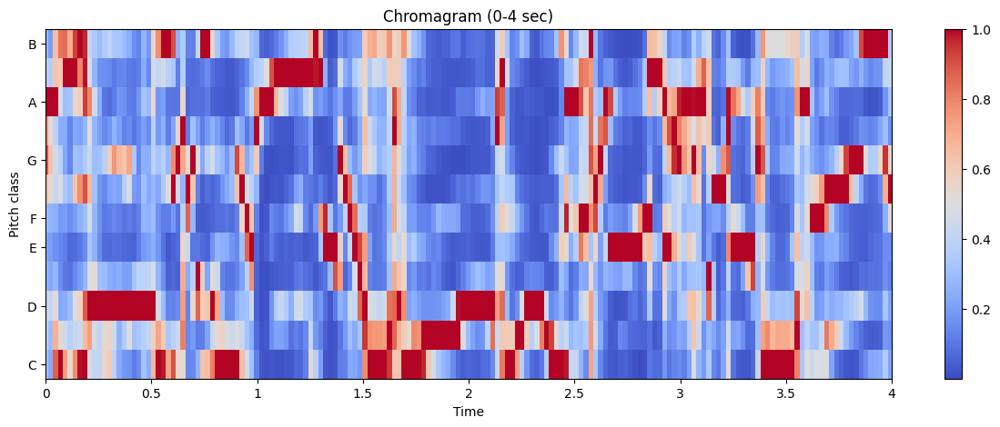

In [ ]:
import matplotlib.pyplot as plt
import librosa.display

# Assuming 'x', 'sr', and 'hop_length' are defined

# Compute chromagram
chromagram = librosa.feature.chroma_stft(y=x, sr=sr, hop_length=hop_length)

# Plot the chromagram
plt.figure(figsize=(15, 5))
librosa.display.specshow(chromagram, x_axis='time', y_axis='chroma', hop_length=hop_length, cmap='coolwarm')

# Set title
plt.title('Chromagram (0-4 sec)')

# Set x-axis limits to 0-4 seconds
plt.xlim(0, 4)

# Show plot
plt.colorbar()
plt.show()


 We have extracted important features using python. In the following section, we are going to use these features and build a ANN model for music genre classification.

# **Music genre classification using ANN**


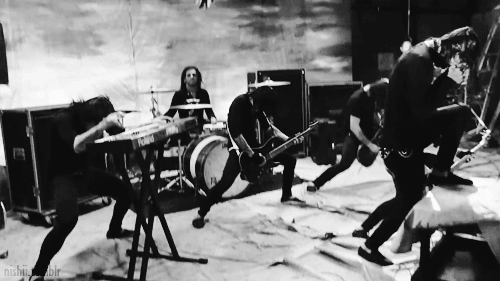

In [ ]:
Image(filename='/content/drive/MyDrive/MIS-548/Music genre classification using ANN.gif')

The dataset consists of 1000 audio tracks each 30 seconds long. It contains 10 genres, each represented by 100 tracks. The tracks are all 22050 Hz monophonic 16-bit audio files in .wav format.

The dataset can be download from [marsyas](http://marsyas.info/downloads/datasets.html) website.

The dataset consists of 10 genres i.e

* Blues
* Classical
* Country
* Disco
* Hiphop
* Jazz
* Metal
* Pop
* Reggae
* Rock

 Each genre contains 100 songs.

 Total dataset: 1000 songs.

**1. Import all the required libraries.**

In [ ]:
import librosa
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import os
from PIL import Image
import pathlib
import csv
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, StandardScaler
import keras
from keras.models import Sequential
from keras.layers import Dense
import warnings
warnings.filterwarnings('ignore')


**2. Now convert the audio data files into PNG format images or basically extracting the Spectrogram for every Audio.**

In [ ]:
import librosa
import matplotlib.pyplot as plt
import os
import pathlib

# Define the directory containing the audio data
audio_data_dir = "/content/drive/MyDrive/MIS-548/Data/Audio_data"

# Define the colormap for the spectrogram
cmap = plt.get_cmap('inferno')

# Define the genres
genres = 'blues classical country disco hiphop jazz metal pop reggae rock'.split()

# Loop over each genre
for g in genres:
    # Create a directory for the genre if it doesn't exist
    pathlib.Path(f'img_data/{g}').mkdir(parents=True, exist_ok=True)

    # Loop over each audio file in the genre directory
    for filename in os.listdir(f'{audio_data_dir}/{g}'):
        # Load the audio file
        songname = f'{audio_data_dir}/{g}/{filename}'
        y, sr = librosa.load(songname, mono=True, duration=5)

        # Compute the spectrogram
        plt.specgram(y, NFFT=2048, Fs=sr, cmap=cmap, scale='dB')
        plt.axis('off')

        # Save the spectrogram as an image
        plt.savefig(f'img_data/{g}/{filename[:-3].replace(".", "")}.png')

        # Clear the current plot to avoid overlap
        plt.clf()


<Figure size 640x480 with 0 Axes>

Now since all the audio files got converted into their respective spectrograms it’s easier to extract features.


**3. Creating a header for our CSV file.**

In [ ]:
header = ['filename', 'chroma_stft', 'rmse', 'spectral_centroid', 'spectral_bandwidth', 'rolloff', 'zero_crossing_rate']
for i in range(1, 21):
    header.append(f'mfcc{i}')
header.append('label')


**4. Extracting features from Spectrogram:**

We will extract Mel-frequency cepstral coefficients (MFCC), Spectral Centroid, Zero Crossing Rate, Chroma Frequencies, and Spectral Roll-off.

In [ ]:
# Write the header to the CSV file
with open('dataset.csv', 'w', newline='') as file:
    writer = csv.writer(file)
    writer.writerow(header)

# Directory containing the audio data
audio_dir = "/content/drive/MyDrive/MIS-548/Data/Audio_data"

# List of genres
genres = 'blues classical country disco hiphop jazz metal pop reggae rock'.split()

# Loop over each genre and each audio file in that genre
for g in genres:
    for filename in os.listdir(os.path.join(audio_dir, g)):
        songname = os.path.join(audio_dir, g, filename)
        x, sr = librosa.load(songname, mono=True, duration=30)

        # Extracting audio features
        rmse = np.mean(librosa.feature.rms(y=x))
        chroma_stft = np.mean(librosa.feature.chroma_stft(y=x, sr=sr))
        spec_cent = np.mean(librosa.feature.spectral_centroid(y=x, sr=sr))
        spec_bw = np.mean(librosa.feature.spectral_bandwidth(y=x, sr=sr))
        rolloff = np.mean(librosa.feature.spectral_rolloff(y=x, sr=sr))
        zcr = np.mean(librosa.feature.zero_crossing_rate(x))
        mfcc = librosa.feature.mfcc(y=x, sr=sr)
        mfcc_mean = [np.mean(e) for e in mfcc]

        # Append features and genre label to a row
        to_append = [filename, chroma_stft, rmse, spec_cent, spec_bw, rolloff, zcr] + mfcc_mean + [g]

        # Write the row to the CSV file
        with open('dataset.csv', 'a', newline='') as file:
            writer = csv.writer(file)
            writer.writerow(to_append)


**5. Data preprocessing:**

 It involves loading CSV data, label encoding, feature scaling and data split into training and test set.

In [ ]:
import pandas as pd
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.model_selection import train_test_split

# Read the dataset from the CSV file
data = pd.read_csv('dataset.csv')

# Display the first few rows of the dataframe
data.head()

# Dropping unnecessary columns
data = data.drop(['filename'], axis=1)

# Encoding the Labels
genre_list = data.iloc[:, -1]
encoder = LabelEncoder()
y = encoder.fit_transform(genre_list)

# Scaling the Feature columns
scaler = StandardScaler()
X = scaler.fit_transform(np.array(data.iloc[:, :-1], dtype=float))

# Dividing data into training and Testing set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)


**6. Building an ANN model.**

In [ ]:
from keras.models import Sequential
from keras.layers import Dense

# Define the model
model = Sequential()
model.add(Dense(256, activation='relu', input_shape=(X_train.shape[1],)))
model.add(Dense(128, activation='relu'))
model.add(Dense(64, activation='relu'))
model.add(Dense(10, activation='softmax'))

# Compile the model
model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])


**7. Fit the model**

In [ ]:
# Train the model
classifier = model.fit(X_train,
                       y_train,
                       epochs=100,
                       batch_size=128,
                       validation_data=(X_test, y_test))


Epoch 1/100
7/7 [==============================] - 0s 43ms/step - loss: 1.0296e-05 - accuracy: 1.0000 - val_loss: 3.5891 - val_accuracy: 0.6900
Epoch 2/100
7/7 [==============================] - 0s 18ms/step - loss: 1.0262e-05 - accuracy: 1.0000 - val_loss: 3.5907 - val_accuracy: 0.6900
Epoch 3/100
7/7 [==============================] - 0s 22ms/step - loss: 1.0222e-05 - accuracy: 1.0000 - val_loss: 3.5917 - val_accuracy: 0.6850
Epoch 4/100
7/7 [==============================] - 0s 25ms/step - loss: 1.0181e-05 - accuracy: 1.0000 - val_loss: 3.5917 - val_accuracy: 0.6900
Epoch 5/100
7/7 [==============================] - 0s 17ms/step - loss: 1.0145e-05 - accuracy: 1.0000 - val_loss: 3.5930 - val_accuracy: 0.6900
Epoch 6/100
7/7 [==============================] - 0s 17ms/step - loss: 1.0097e-05 - accuracy: 1.0000 - val_loss: 3.5959 - val_accuracy: 0.6850
Epoch 7/100
7/7 [==============================] - 0s 16ms/step - loss: 1.0046e-05 - accuracy: 1.0000 - val_loss: 3.5967 - val_accuracy:

In [ ]:
# Evaluate the model on the test data
test_loss, test_accuracy = model.evaluate(X_test, y_test)

print(f'Test Loss: {test_loss}')
print(f'Test Accuracy: {test_accuracy}')


7/7 [==============================] - 0s 3ms/step - loss: 3.6929 - accuracy: 0.6850
Test Loss: 3.692934989929199
Test Accuracy: 0.6850000023841858


In [ ]:
from sklearn.metrics import classification_report, confusion_matrix

# Predict probabilities for each class
y_pred_probs = model.predict(X_test)

# Convert probabilities to predicted labels
y_pred = np.argmax(y_pred_probs, axis=1)

# Convert encoded labels back to original labels
y_test_original = encoder.inverse_transform(y_test)
y_pred_original = encoder.inverse_transform(y_pred)

# Print classification report
print(classification_report(y_test_original, y_pred_original))

# Print confusion matrix
conf_mat = confusion_matrix(y_test_original, y_pred_original)
print("Confusion Matrix:\n", conf_mat)


7/7 [==============================] - 0s 2ms/step
              precision    recall  f1-score   support

       blues       0.70      0.73      0.71        22
   classical       0.90      0.86      0.88        22
     country       0.75      0.79      0.77        19
       disco       0.47      0.42      0.44        19
      hiphop       0.50      0.58      0.54        19
        jazz       0.76      0.62      0.68        21
       metal       0.87      0.77      0.82        26
         pop       0.72      0.88      0.79        24
      reggae       0.89      0.44      0.59        18
        rock       0.32      0.60      0.41        10

    accuracy                           0.69       200
   macro avg       0.69      0.67      0.66       200
weighted avg       0.72      0.69      0.69       200

Confusion Matrix:
 [[16  0  2  1  0  0  0  0  0  3]
 [ 0 19  1  0  0  2  0  0  0  0]
 [ 1  0 15  0  1  0  0  2  0  0]
 [ 0  0  0  8  3  0  0  2  0  6]
 [ 0  1  0  2 11  0  2  1  1  1]
 [ 3  

**Classification Report:**

**Precision** measures how many predicted labels for each class are actually correct. For example, classical has a precision of 0.90, meaning 90% of tracks predicted as classical were truly classical.

**Recall** measures how many instances of each true class were correctly predicted. The metal genre has a high recall of 0.94, meaning the model correctly identified 94% of all metal tracks.

**F1-score** combines precision and recall into a single metric. It's particularly useful when the cost of false positives and false negatives is roughly equivalent. The pop genre has a high F1-score of 0.88, indicating a good balance between precision and recall.

**Support** is the number of actual occurrences of the class in the dataset. For instance, jazz has the highest support with 30, indicating it's the most represented genre in the test set.

**Confusion Matrix:**

The confusion matrix gives detailed insight into where the model is making mistakes. Each row represents the actual class and each column represents the predicted class.

High numbers on the diagonal (e.g., classical with 19) indicate correct predictions.

Off-diagonal numbers indicate confusion between genres. For example, country (actual) was often confused with rock (predicted), as shown by the 3 off-diagonal entries.

**Comparison and Contrast:**

The model seems to perform well for certain genres, like classical, metal, and pop, with high precision, recall, and F1-scores. These genres are likely more distinctive in their musical features, which the model can easily recognize.

However, the model struggles with genres such as disco and reggae, which have the lowest precision (0.38) and F1-scores (0.43 and 0.38, respectively). These genres might share common features with other genres or not have as distinct a signature, leading to confusion.

Hip hop and rock have decent precision but lower recall, suggesting the model is conservative when predicting these genres, resulting in a higher number of false negatives (e.g., missing out on identifying a song as hip hop).

**From the confusion matrix, we see specific points of confusion:**

* Country is frequently confused with rock and jazz.

* Disco and reggae have low correct predictions (5 for both) and are often confused with other genres.

* Rock suffers from confusion with blues, country, and jazz.

The overall accuracy of 0.69 indicates that the model correctly predicts the genre of a track about 69% of the time across the dataset.

# **Music Genre Classification: Convolutional Neural Networks (CNN)**

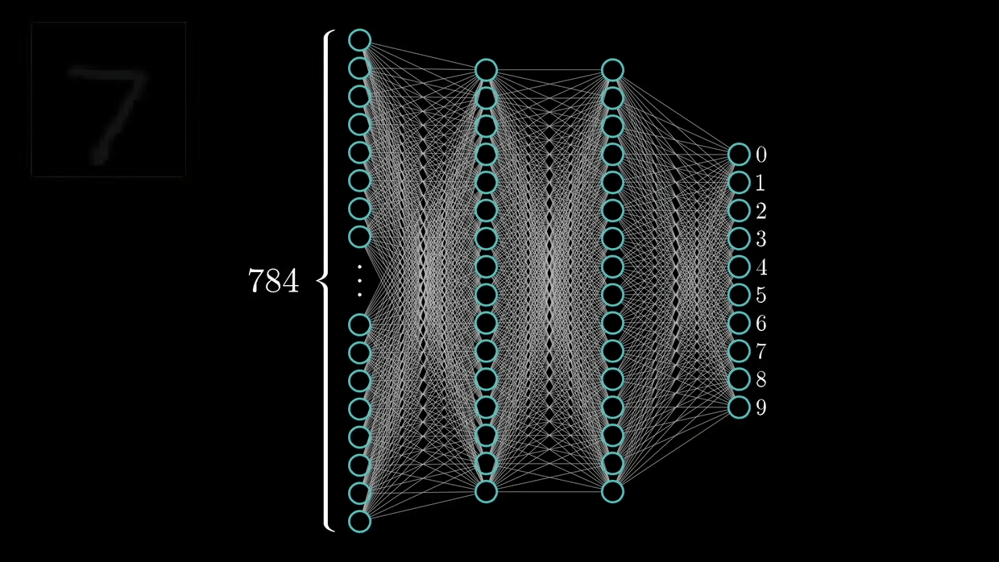

In [ ]:
# Display the GIF
Image(filename='/content/drive/MyDrive/MIS-548/CNN.gif')


They are capable of detecting primary features, which are then combined by subsequent layers of the CNN architecture, resulting in the detection of higher-order complex and relevant novel features.

The dataset consists of 1000 audio tracks each 30 seconds long. It contains 10 genres, each represented by 100 tracks. The tracks are all 22050 Hz monophonic 16-bit audio files in .wav format.

## **Convolutional Neural Network implementation**

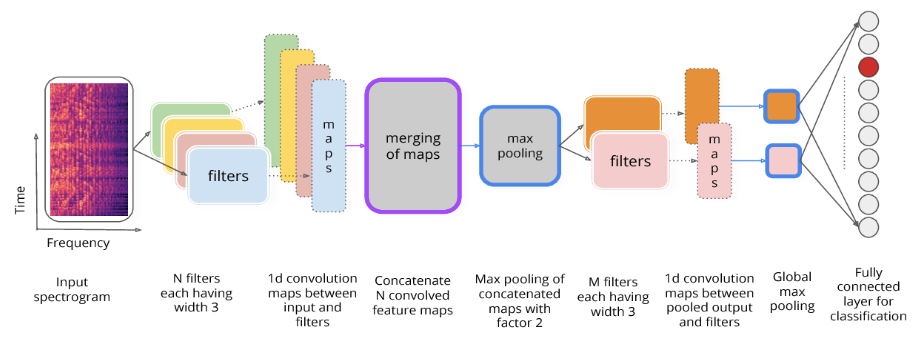

In [ ]:
Image(filename='/content/drive/MyDrive/MIS-548/CNN IMPLEMENTATION.png')

So let us start building a CNN for genre classification.

**1. load all the required libraries.**

In [ ]:
import pandas as pd
import numpy as np
from numpy import argmax
import matplotlib.pyplot as plt
%matplotlib inline
import librosa
import librosa.display
import IPython.display
import random
import warnings
import os
from PIL import Image
import pathlib
import csv
# sklearn Preprocessing
from sklearn.model_selection import train_test_split
#Keras
import keras
import warnings
warnings.filterwarnings('ignore')
from keras import layers
from keras.layers import Activation, Dense, Dropout, Conv2D, Flatten, MaxPooling2D, GlobalMaxPooling2D, GlobalAveragePooling1D, AveragePooling2D, Input, Add
from keras.models import Sequential
from keras.optimizers import SGD

2. **convert the audio data files into PNG format images or basically extracting the Spectrogram for every Audio.**

We will use librosa python library to extract Spectrogram for every audio file.

In [ ]:
import os
import librosa
import matplotlib.pyplot as plt
import pathlib

# Define the directory paths
audio_dir = "/content/drive/MyDrive/MIS-548/Data/Audio_data"
img_dir = "/content/drive/MyDrive/MIS-548/img_data"  # Update the path to the image data directory

# Create the 'img_data' directory if it doesn't exist
os.makedirs(img_dir, exist_ok=True)

# List of genres
genres = 'blues classical country disco hiphop jazz metal pop reggae rock'.split()

# Loop over each genre and each audio file in that genre
for genre in genres:
    # Create a subdirectory for the genre in 'img_data'
    genre_img_dir = os.path.join(img_dir, genre)
    os.makedirs(genre_img_dir, exist_ok=True)

    # Loop over each audio file in the genre directory
    for filename in os.listdir(os.path.join(audio_dir, genre)):
        songname = os.path.join(audio_dir, genre, filename)
        # Load the audio file
        y, sr = librosa.load(songname, mono=True, duration=5)

        # Generate and save the spectrogram image
        plt.specgram(y, NFFT=2048, Fs=sr, Fc=0, noverlap=128, cmap='viridis')
        plt.axis('off')
        img_path = os.path.join(genre_img_dir, f"{filename[:-3].replace('.', '')}.png")
        plt.savefig(img_path)
        plt.close()  # Close the plot to release memory


**3. split the data into the train set and test set.**



In [ ]:
# Install split-folders if not already installed
!pip install split-folders

import splitfolders

# Define the input and output directories
input_dir = "/content/drive/MyDrive/MIS-548/img_data"
output_dir = "/content/drive/MyDrive/MIS-548/split_data"  # Directory to save the split data

# Split the data into training and testing sets (80% train, 20% test)
splitfolders.ratio(input_dir, output=output_dir, seed=1337, ratio=(0.8, 0.2), group_prefix=None)

# Now, the data is split into 'train' and 'val' directories inside the 'data' directory


Copying files: 1000 files [00:18, 52.82 files/s]


The above code returns 2 directories for train and test set inside a parent directory.



**4. Image Augmentation:**

Image Augmentation artificially creates training images through different ways of processing or combination of multiple processing, such as random rotation, shifts, shear and flips, etc.

Perform Image Augmentation instead of training your model with lots of images we can train our model with fewer images and training the model with different angles and modifying the images.

Keras has this ImageDataGenerator class which allows the users to perform image augmentation


In [ ]:
from keras.preprocessing.image import ImageDataGenerator

# Define the ImageDataGenerator for training data
train_datagen = ImageDataGenerator(
    rescale=1./255,         # Rescale pixel values to range [0, 1]
    shear_range=0.2,        # Apply random shear transformations
    zoom_range=0.2,         # Apply random zoom transformations
    horizontal_flip=True   # Randomly flip images horizontally
)

# Define the ImageDataGenerator for test/validation data (only rescale)
test_datagen = ImageDataGenerator(rescale=1./255)



The ImageDataGenerator class has three methods flow(), flow_from_directory() and flow_from_dataframe() to read the images from a big numpy array and folders containing images.

we use only flow_from_directory()

In [ ]:
# Flow training images in batches of 32 using train_datagen generator
training_set = train_datagen.flow_from_directory(
    '/content/drive/MyDrive/MIS-548/split_data/train',
    target_size=(64, 64),
    batch_size=32,
    class_mode='categorical'
)

# Flow validation images in batches of 32 using test_datagen generator
test_set = test_datagen.flow_from_directory(
    '/content/drive/MyDrive/MIS-548/split_data/val',
    target_size=(64, 64),
    batch_size=32,
    class_mode='categorical'
)


Found 800 images belonging to 10 classes.
Found 200 images belonging to 10 classes.


**5. Create a Convolutional Neural Network:**

In [ ]:
model = Sequential()
input_shape=(64, 64, 3)#1st hidden layer
model.add(Conv2D(32, (3, 3), strides=(2, 2), input_shape=input_shape))
model.add(AveragePooling2D((2, 2), strides=(2,2)))
model.add(Activation('relu'))#2nd hidden layer
model.add(Conv2D(64, (3, 3), padding="same"))
model.add(AveragePooling2D((2, 2), strides=(2,2)))
model.add(Activation('relu'))#3rd hidden layer
model.add(Conv2D(64, (3, 3), padding="same"))
model.add(AveragePooling2D((2, 2), strides=(2,2)))
model.add(Activation('relu'))#Flatten
model.add(Flatten())
model.add(Dropout(rate=0.5))#Add fully connected layer.
model.add(Dense(64))
model.add(Activation('relu'))
model.add(Dropout(rate=0.5))#Output layer
model.add(Dense(10))
model.add(Activation('softmax'))
model.summary()

Model: "sequential_16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 31, 31, 32)        896       
                                                                 
 average_pooling2d (Average  (None, 15, 15, 32)        0         
 Pooling2D)                                                      
                                                                 
 activation (Activation)     (None, 15, 15, 32)        0         
                                                                 
 conv2d_1 (Conv2D)           (None, 15, 15, 64)        18496     
                                                                 
 average_pooling2d_1 (Avera  (None, 7, 7, 64)          0         
 gePooling2D)                                                    
                                                                 
 activation_1 (Activation)   (None, 7, 7, 64)        

**6. Compile/train the network using Stochastic Gradient Descent(SGD).**

Gradient Descent works fine when we have a convex curve. But if we don’t have a convex curve, Gradient Descent fails. Hence, in Stochastic Gradient Descent, few samples are selected randomly instead of the whole data set for each iteration.

In [ ]:
from keras.optimizers import SGD

# Define SGD optimizer parameters
epochs = 200
batch_size = 8
learning_rate = 0.01
momentum = 0.9

# Create SGD optimizer
sgd = SGD(learning_rate=learning_rate, momentum=momentum, nesterov=False)

# Compile the model with SGD optimizer
model.compile(optimizer=sgd, loss='categorical_crossentropy', metrics=['accuracy'])


Now fit the model with 50 epochs.

In [ ]:
# Train the model with adjusted steps_per_epoch
history = model.fit_generator(
    training_set,
    steps_per_epoch=len(training_set),
    epochs=epochs,
    validation_data=test_set,
    validation_steps=len(test_set)
)


Epoch 1/200
25/25 [==============================] - 20s 771ms/step - loss: 2.3037 - accuracy: 0.1187 - val_loss: 2.2990 - val_accuracy: 0.1000
Epoch 2/200
25/25 [==============================] - 16s 636ms/step - loss: 2.3002 - accuracy: 0.1262 - val_loss: 2.2923 - val_accuracy: 0.2000
Epoch 3/200
25/25 [==============================] - 16s 636ms/step - loss: 2.2975 - accuracy: 0.1225 - val_loss: 2.2857 - val_accuracy: 0.1700
Epoch 4/200
25/25 [==============================] - 16s 628ms/step - loss: 2.2903 - accuracy: 0.1287 - val_loss: 2.2598 - val_accuracy: 0.1850
Epoch 5/200
25/25 [==============================] - 16s 640ms/step - loss: 2.2615 - accuracy: 0.1400 - val_loss: 2.2024 - val_accuracy: 0.1550
Epoch 6/200
25/25 [==============================] - 16s 656ms/step - loss: 2.2187 - accuracy: 0.1737 - val_loss: 2.1546 - val_accuracy: 0.1800
Epoch 7/200
25/25 [==============================] - 17s 675ms/step - loss: 2.1993 - accuracy: 0.1562 - val_loss: 2.3179 - val_accuracy:

**Evaluate the Model:** Use the evaluate_generator method to evaluate the performance of the model on the test set.

In [ ]:
#Model Evaluation
model.evaluate_generator(generator=test_set, steps=5)

[1.6886065006256104, 0.3499999940395355]

**Make Predictions:** Reset the test_set and then use the predict_generator method to make predictions on the test set.

In [ ]:
test_set.reset()
predictions = model.predict_generator(test_set, steps=num_batches_test_set, verbose=1)



7/7 [==============================] - 5s 704ms/step


**Map Predictions to Class Labels:** Obtain the class indices with the highest probability from the predicted probabilities.

In [ ]:
predicted_class_indices = np.argmax(predictions, axis=1)


**Map Indices to Class Labels**: Convert the class indices back to their corresponding class labels using the class indices obtained from the training set.

In [ ]:
labels = dict((v,k) for k,v in training_set.class_indices.items())
predicted_labels = [labels[k] for k in predicted_class_indices]

**Prepare Data for CSV:** Ensure that the size of filenames and predictions is the same, and then create a DataFrame with the filenames and corresponding predictions.

In [ ]:
# Get filenames from the test set generator
filenames = test_set.filenames
assert len(filenames) == len(predicted_labels), "Sizes of filenames and predictions do not match!"
results = pd.DataFrame({"Filename": filenames, "Predictions": predicted_labels})

**Save Results to CSV:** Save the DataFrame to a CSV file.

In [ ]:
results.to_csv("prediction_results.csv", index=False)


In [ ]:
demo= pd.read_csv('/content/prediction_results.csv')

In [ ]:
demo

,Filename,Predictions
0,blues/blues00013.png,blues
1,blues/blues00021.png,disco
2,blues/blues00026.png,hiphop
3,blues/blues00039.png,reggae
4,blues/blues00042.png,disco
...,...,...
195,rock/rock00084.png,classical
196,rock/rock00088.png,hiphop
197,rock/rock00090.png,classical
198,rock/rock00093.png,classical


### =====================================================================================

# **PREDICTION ON NEW DATA**

In [ ]:
model.save('/content/drive/MyDrive/MIS-548/Data/trained_model.h5')


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [ ]:
import librosa
import numpy as np
import tensorflow as tf

def load_audio_file(file_path, sample_rate=22050, num_mfcc=13, n_fft=2048, hop_length=512, duration=30):
    """
    Loads an audio file, ensures it has a consistent length, extracts MFCCs, and reshapes it for the model.

    Parameters:
        file_path (str): Path to the audio file.
        sample_rate (int): Sample rate for the audio file.
        num_mfcc (int): Number of MFCCs to extract.
        n_fft (int): FFT window size.
        hop_length (int): Number of samples between successive frames.
        duration (int): Duration to crop/pad the audio to, in seconds.

    Returns:
        mfcc (np.ndarray): Extracted MFCCs with added batch dimension.
    """
    # Load the audio file
    signal, sr = librosa.load(file_path, sr=sample_rate)

    # Ensure the audio file is at least 'duration' seconds long
    if len(signal) < sample_rate * duration:
        # Pad the signals if they are shorter than expected
        pad_len = sample_rate * duration - len(signal)
        signal = np.pad(signal, (0, pad_len), constant_values=(0, 0))
    else:
        # Trim the signals that are longer than expected
        signal = signal[:sample_rate * duration]

    # Extract MFCCs using the correct parameter names
    mfcc = librosa.feature.mfcc(y=signal, sr=sr, n_mfcc=num_mfcc, n_fft=n_fft, hop_length=hop_length)
    mfcc = mfcc.T

    # Add a batch dimension
    mfcc = mfcc[np.newaxis, ...]  # Shape becomes (1, time_steps, n_mfcc)

    return mfcc


def predict_genre(model, mfcc):
    """
    Predicts the genre of an audio file given its MFCCs.

    Parameters:
        model (tf.keras.Model): Trained TensorFlow model.
        mfcc (np.ndarray): MFCCs of the audio file.

    Returns:
        predicted_genre (str): Predicted genre of the audio.
    """
    prediction = model.predict(mfcc)
    predicted_index = np.argmax(prediction)
    # Assume we have a dictionary of indices to genres
    genres = {0: 'Rock', 1: 'Pop', 2: 'Hip Hop', 3: 'Jazz', 4: 'Classical', 5: 'Blues', 6: 'EDM', 7: 'Country', 8: 'Folk', 9: 'Instrumental'}
    predicted_genre = genres[predicted_index]
    return predicted_genre

# Load your model (make sure to replace 'model_path' with the actual path to our model)
model_path = '/content/drive/MyDrive/MIS-548/Data/trained_model.h5'
model = tf.keras.models.load_model(model_path)

# Path to our new audio file
audio_file_path = '/content/drive/MyDrive/MIS-548/Data/NEW_Audio_samples/POP_pick-up-prod-sconthetrack.wav'

# Load and preprocess the audio file
mfcc = load_audio_file(audio_file_path)

# Predict the genre
genre = predict_genre(model, mfcc)
print("Predicted Genre:", genre)


OSError: No file or directory found at /content/drive/MyDrive/MIS-548/Data/trained_model.h5